# Respiratory Audio Analysis - Manasvi Trivedi

### Dataset

The Respiratory Sound database was originally compiled to support the scientific challenge organized at Int. Conf. on Biomedical Health Informatics - ICBHI 2017. The current version of this database is made freely available for research and contains both the public and the private dataset of the ICBHI challenge.

The Respiratory Sound Database contains audio samples, collected independently by two research teams in two different countries, over several years. Most of the database consists of audio samples recorded by the School of Health Sciences, University of Aveiro (ESSUA) research team at the Respiratory Research and Rehabilitation Laboratory (Lab3R), ESSUA and at Hospital Infante D. Pedro, Aveiro, Portugal. The second research team, from the Aristotle University of Thessaloniki (AUTH) and the University of Coimbra (UC), acquired respiratory sounds at the Papanikolaou General Hospital, Thessaloniki and at the General Hospital of Imathia (Health Unit of Naousa), Greece.

Link: https://bhichallenge.med.auth.gr/

### Import Libraries

In [1]:
!pip install librosa

In [2]:
import pandas as pd
import numpy as np
import os
import librosa
import matplotlib.pyplot as plt
import IPython.display as ipd
import librosa.display
import glob as gb
import seaborn as sns

%matplotlib inline

### Preprocessing

In [3]:
audio_dataset_path='ICBHI_final_database/ICBHI_final_database'

In [4]:
# read audio files location

audio_location=np.array(gb.glob("ICBHI_final_database\ICBHI_final_database\*.wav"))

In [5]:
audio_location

array(['ICBHI_final_database\\ICBHI_final_database\\101_1b1_Al_sc_Meditron.wav',
       'ICBHI_final_database\\ICBHI_final_database\\101_1b1_Pr_sc_Meditron.wav',
       'ICBHI_final_database\\ICBHI_final_database\\102_1b1_Ar_sc_Meditron.wav',
       'ICBHI_final_database\\ICBHI_final_database\\103_2b2_Ar_mc_LittC2SE.wav',
       'ICBHI_final_database\\ICBHI_final_database\\104_1b1_Al_sc_Litt3200.wav',
       'ICBHI_final_database\\ICBHI_final_database\\104_1b1_Ar_sc_Litt3200.wav',
       'ICBHI_final_database\\ICBHI_final_database\\104_1b1_Ll_sc_Litt3200.wav',
       'ICBHI_final_database\\ICBHI_final_database\\104_1b1_Lr_sc_Litt3200.wav',
       'ICBHI_final_database\\ICBHI_final_database\\104_1b1_Pl_sc_Litt3200.wav',
       'ICBHI_final_database\\ICBHI_final_database\\104_1b1_Pr_sc_Litt3200.wav',
       'ICBHI_final_database\\ICBHI_final_database\\105_1b1_Tc_sc_Meditron.wav',
       'ICBHI_final_database\\ICBHI_final_database\\106_2b1_Pl_mc_LittC2SE.wav',
       'ICBHI_final_database

In [6]:
def features_extractor(file):
    audio, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
    mfccs_features = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=20)
    mfccs_scaled_features = np.mean(mfccs_features.T,axis=0)
    
    return mfccs_scaled_features

In [7]:
# extract features

extracted_features = []
given_features = []
for file_name in audio_location:
    data = features_extractor(file_name)
    extracted_features.append(data)
    given_features.append(file_name[-26:-4].split('_'))

In [8]:
print(len(extracted_features))
print(len(given_features))

920
920


In [9]:
extracted_features_df = pd.DataFrame(extracted_features)
given_features_df = pd.DataFrame(given_features)

In [10]:
extracted_features_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-529.141052,104.422600,70.157272,42.594322,31.285309,27.507853,22.268408,16.565247,15.324461,16.719833,14.703952,8.449949,3.867675,4.896591,8.413424,9.329066,6.876754,3.965102,2.853076,3.373066
1,-583.065674,95.399147,57.618233,31.386606,28.198784,33.572395,31.645170,22.793486,16.663855,15.634995,14.033536,9.239866,5.830477,7.336867,10.592948,10.621799,7.176963,3.741269,2.677022,3.644836
2,-596.954956,116.085228,60.693291,25.557753,26.208939,38.514072,36.050949,18.642031,3.532676,0.809022,5.735795,9.658901,9.136521,5.531387,2.170032,2.103611,5.247618,7.931124,7.100749,4.055834
3,-418.957947,68.036453,48.221279,33.115627,28.069042,26.474550,22.740404,18.175056,15.945485,15.117650,13.326963,10.854409,9.648497,9.757352,9.585453,8.608078,7.710111,7.181937,6.383652,5.585670
4,-441.516113,100.970589,74.049561,43.235130,19.693937,7.835150,5.510894,8.038204,11.745389,14.876775,16.781233,17.164309,15.990077,13.542236,10.291447,6.772102,3.628615,1.567052,0.992704,1.651415


In [11]:
given_features_df.columns = ['Person Number', 'Recording Index', 'Chest Location', 'Acquisition Mode', 'Recording Equipment']
given_features_df.head()

,Person Number,Recording Index,Chest Location,Acquisition Mode,Recording Equipment
0,101,1b1,Al,sc,Meditron
1,101,1b1,Pr,sc,Meditron
2,102,1b1,Ar,sc,Meditron
3,103,2b2,Ar,mc,LittC2SE
4,104,1b1,Al,sc,Litt3200


In [12]:
# concat features

df = pd.concat([given_features_df, extracted_features_df], axis=1)
df['Person Number'] = pd.to_numeric(df['Person Number'])

In [13]:
df.head()

,Person Number,Recording Index,Chest Location,Acquisition Mode,Recording Equipment,0,1,2,3,4,...,10,11,12,13,14,15,16,17,18,19
0,101,1b1,Al,sc,Meditron,-529.141052,104.422600,70.157272,42.594322,31.285309,...,14.703952,8.449949,3.867675,4.896591,8.413424,9.329066,6.876754,3.965102,2.853076,3.373066
1,101,1b1,Pr,sc,Meditron,-583.065674,95.399147,57.618233,31.386606,28.198784,...,14.033536,9.239866,5.830477,7.336867,10.592948,10.621799,7.176963,3.741269,2.677022,3.644836
2,102,1b1,Ar,sc,Meditron,-596.954956,116.085228,60.693291,25.557753,26.208939,...,5.735795,9.658901,9.136521,5.531387,2.170032,2.103611,5.247618,7.931124,7.100749,4.055834
3,103,2b2,Ar,mc,LittC2SE,-418.957947,68.036453,48.221279,33.115627,28.069042,...,13.326963,10.854409,9.648497,9.757352,9.585453,8.608078,7.710111,7.181937,6.383652,5.585670
4,104,1b1,Al,sc,Litt3200,-441.516113,100.970589,74.049561,43.235130,19.693937,...,16.781233,17.164309,15.990077,13.542236,10.291447,6.772102,3.628615,1.567052,0.992704,1.651415


In [14]:
# read diagnostics

diag = pd.read_table('ICBHI_final_database/ICBHI_Challenge_diagnosis.txt', delimiter = '\t', header = None, names = ["Person Number", "Target"])
diag.head()

,Person Number,Target
0,101,URTI
1,102,Healthy
2,103,Asthma
3,104,COPD
4,105,URTI


In [15]:
# read metadata

metadata=pd.read_table('ICBHI_final_database/ICBHI_Challenge_demographic_information.txt', delimiter = '\t', header = None, names = ["Person Number", "Age", "Sex", "Adult BMI (kg/m2)", "Child Weight (kg)", "Child Height (cm)"])
metadata.head()

,Person Number,Age,Sex,Adult BMI (kg/m2),Child Weight (kg),Child Height (cm)
0,101,3.00,F,NaN,19.0,99.0
1,102,0.75,F,NaN,9.8,73.0
2,103,70.00,F,33.00,NaN,NaN
3,104,70.00,F,28.47,NaN,NaN
4,105,7.00,F,NaN,32.0,135.0


In [16]:
metadata = pd.merge(metadata, diag, left_on = 'Person Number', right_on = 'Person Number', how = 'outer')

In [17]:
metadata.head()

,Person Number,Age,Sex,Adult BMI (kg/m2),Child Weight (kg),Child Height (cm),Target
0,101,3.00,F,NaN,19.0,99.0,URTI
1,102,0.75,F,NaN,9.8,73.0,Healthy
2,103,70.00,F,33.00,NaN,NaN,Asthma
3,104,70.00,F,28.47,NaN,NaN,COPD
4,105,7.00,F,NaN,32.0,135.0,URTI


In [18]:
metadata.isna().sum()

Person Number         0
Age                   1
Sex                   1
Adult BMI (kg/m2)    51
Child Weight (kg)    82
Child Height (cm)    84
Target                0
dtype: int64

In [19]:
metadata = metadata.drop('Adult BMI (kg/m2)', 1)
metadata = metadata.drop('Child Weight (kg)', 1)
metadata = metadata.drop('Child Height (cm)', 1)

In [20]:
metadata['Age'].fillna((metadata['Age'].mean()), inplace=True)
metadata = metadata.apply(lambda x: x.fillna(x.value_counts().index[0]))

In [21]:
metadata.isna().sum()

Person Number    0
Age              0
Sex              0
Target           0
dtype: int64

In [22]:
metadata.head()

,Person Number,Age,Sex,Target
0,101,3.00,F,URTI
1,102,0.75,F,Healthy
2,103,70.00,F,Asthma
3,104,70.00,F,COPD
4,105,7.00,F,URTI


In [23]:
# merge dataset

df = pd.merge(metadata, df, left_on = 'Person Number', right_on = 'Person Number', how = 'outer')

In [24]:
df.head()

,Person Number,Age,Sex,Target,Recording Index,Chest Location,Acquisition Mode,Recording Equipment,0,1,...,10,11,12,13,14,15,16,17,18,19
0,101,3.00,F,URTI,1b1,Al,sc,Meditron,-529.141052,104.422600,...,14.703952,8.449949,3.867675,4.896591,8.413424,9.329066,6.876754,3.965102,2.853076,3.373066
1,101,3.00,F,URTI,1b1,Pr,sc,Meditron,-583.065674,95.399147,...,14.033536,9.239866,5.830477,7.336867,10.592948,10.621799,7.176963,3.741269,2.677022,3.644836
2,102,0.75,F,Healthy,1b1,Ar,sc,Meditron,-596.954956,116.085228,...,5.735795,9.658901,9.136521,5.531387,2.170032,2.103611,5.247618,7.931124,7.100749,4.055834
3,103,70.00,F,Asthma,2b2,Ar,mc,LittC2SE,-418.957947,68.036453,...,13.326963,10.854409,9.648497,9.757352,9.585453,8.608078,7.710111,7.181937,6.383652,5.585670
4,104,70.00,F,COPD,1b1,Al,sc,Litt3200,-441.516113,100.970589,...,16.781233,17.164309,15.990077,13.542236,10.291447,6.772102,3.628615,1.567052,0.992704,1.651415


### Exploratory Data Analysis

In [25]:
file_urti = 'ICBHI_final_database/ICBHI_final_database/101_1b1_Al_sc_Meditron.wav'
file_asthama = 'ICBHI_final_database/ICBHI_final_database/103_2b2_Ar_mc_LittC2SE.wav'
file_healthy = 'ICBHI_final_database/ICBHI_final_database/102_1b1_Ar_sc_Meditron.wav'

#### URTI audio

In [26]:
# read URTI(Upper Respiratory Tract Infection) sample file data

data, sample_rate = librosa.load(file_urti)
print(data, sample_rate)

[0.06973912 0.10266001 0.09116188 ... 0.08305359 0.08018959 0.08612607] 22050


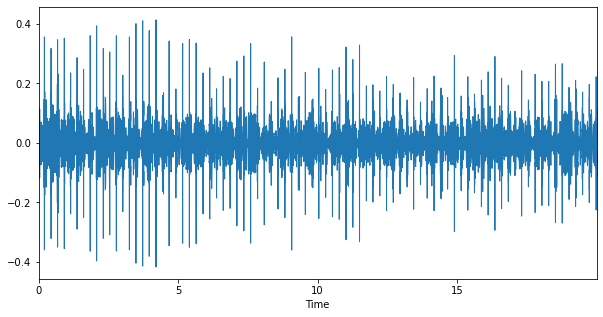

In [27]:
# plot data

plt.figure(figsize=(10, 5))
librosa.display.waveplot(data, sr = sample_rate)

In [28]:
ipd.Audio(file_urti)

#### Asthama audio

In [29]:
# read asthama sample file data

data, sample_rate = librosa.load(file_asthama)
print(data, sample_rate)

[-0.2545646  -0.3705388  -0.3232833  ... -0.05145296 -0.04831332
 -0.05130891] 22050


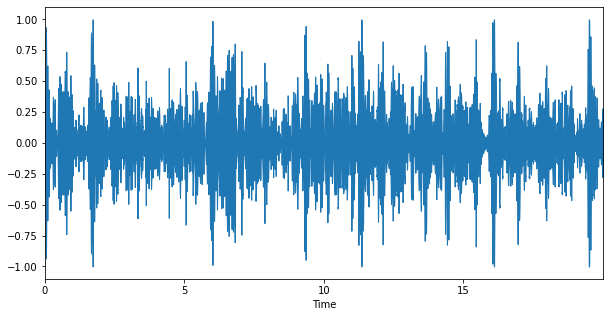

In [30]:
# plot data

plt.figure(figsize=(10, 5))
librosa.display.waveplot(data,sr=sample_rate)

In [31]:
ipd.Audio(file_asthama)

#### Healthy audio

In [32]:
# read healthy sample file data

data, sample_rate = librosa.load(file_healthy)
print(data, sample_rate)

[ 0.00283427  0.00423394  0.0036414  ... -0.01369482 -0.01395124
 -0.01601286] 22050


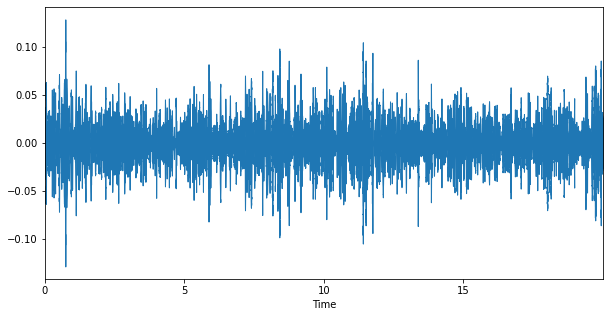

In [33]:
# plot data

plt.figure(figsize=(10, 5))
librosa.display.waveplot(data,sr=sample_rate)

In [34]:
ipd.Audio(file_asthama)

Text(0.5, 1.0, 'Chest Location')

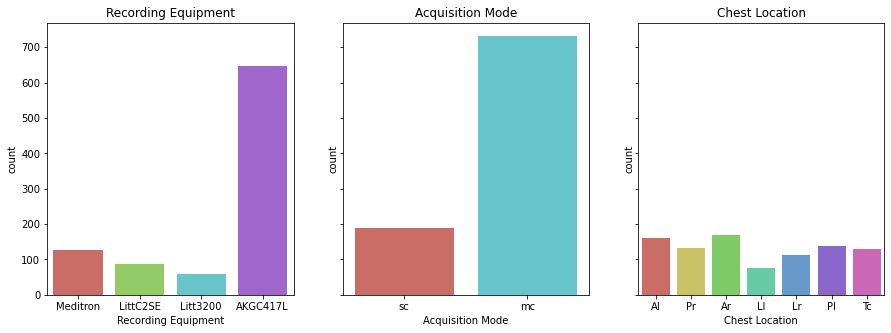

In [35]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=True)

sns.countplot(ax=axes[0], x = 'Recording Equipment', data = df, palette="hls")
axes[0].set_title('Recording Equipment')

sns.countplot(ax=axes[1], x = 'Acquisition Mode', data = df, palette="hls")
axes[1].set_title('Acquisition Mode')

sns.countplot(ax=axes[2], x = 'Chest Location', data = df, palette="hls")
axes[2].set_title('Chest Location')

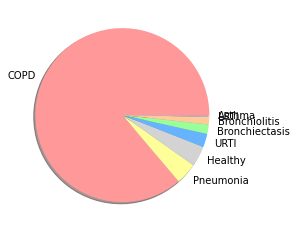

In [36]:
labels = df['Target'].value_counts().index.tolist()
data = df['Target'].value_counts().tolist()
colors = ['#ff9999', '#FFFF99' ,'#D3D3D3','#66b3ff','#99ff99','#ffcc99', '#CBC3E3']

plt.pie(data, labels = labels, colors = colors, shadow = True)
plt.show()

### Label Encoding

In [37]:
# replace all diseases with unhealthy

df['Target'] = df['Target'].replace(('URTI', 'Bronchiectasis', 'Bronchiolitis', 'Pneumonia','LRTI', 'Asthma', 'COPD'),('UnHealthy','UnHealthy', 'UnHealthy', 'UnHealthy', 'UnHealthy','UnHealthy', 'UnHealthy'))

In [38]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df['Target'] = le.fit_transform(df['Target'])
df['Sex'] = le.fit_transform(df['Sex'])
df['Acquisition Mode'] = le.fit_transform(df['Acquisition Mode'])

### One Hot Encoding

In [39]:
cl = pd.get_dummies(df['Chest Location'])
df = df.drop('Chest Location',axis = 1)
df = df.join(cl)

re = pd.get_dummies(df['Recording Equipment'])
df = df.drop('Recording Equipment',axis = 1)
df = df.join(re)

In [40]:
df.head()

,Person Number,Age,Sex,Target,Recording Index,Acquisition Mode,0,1,2,3,...,Ar,Ll,Lr,Pl,Pr,Tc,AKGC417L,Litt3200,LittC2SE,Meditron
0,101,3.00,0,1,1b1,1,-529.141052,104.422600,70.157272,42.594322,...,0,0,0,0,0,0,0,0,0,1
1,101,3.00,0,1,1b1,1,-583.065674,95.399147,57.618233,31.386606,...,0,0,0,0,1,0,0,0,0,1
2,102,0.75,0,0,1b1,1,-596.954956,116.085228,60.693291,25.557753,...,1,0,0,0,0,0,0,0,0,1
3,103,70.00,0,1,2b2,0,-418.957947,68.036453,48.221279,33.115627,...,1,0,0,0,0,0,0,0,1,0
4,104,70.00,0,1,1b1,1,-441.516113,100.970589,74.049561,43.235130,...,0,0,0,0,0,0,0,1,0,0


In [41]:
# drop unnecessary columns

df = df.drop('Person Number', 1)
df = df.drop('Recording Index', 1)

In [42]:
y = df['Target']

In [43]:
print(df.shape, y.shape)

(920, 35) (920,)


### Oversampling

In [44]:
import imblearn
from imblearn.over_sampling import SMOTE

x_resample, y_resample  = SMOTE().fit_resample(df, y.values.ravel())

print(x_resample.shape)
print(y_resample.shape)

(1770, 35)
(1770,)


C:\Users\manas\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


### Test Train Split

In [45]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x_resample, y_resample, test_size = 0.2, random_state = 0)
print("Shape of the x Train :", x_train.shape)
print("Shape of the y Train :", y_train.shape)
print("Shape of the x Test :", x_test.shape)
print("Shape of the y Test :", y_test.shape)

Shape of the x Train : (1416, 35)
Shape of the y Train : (1416,)
Shape of the x Test : (354, 35)
Shape of the y Test : (354,)


### Classification: Logistic Regression

In [46]:
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression()
clf.fit(x_train, y_train)

C:\Users\manas\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Users\manas\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [47]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

y_pred =  clf.predict(x_test)
print('Accuracy Score on train data: ', accuracy_score(y_train, y_pred=clf.predict(x_train)))
print('Accuracy Score on test data: ', accuracy_score(y_test, y_pred=y_pred))
result = [['Logistic Regression'], [accuracy_score(y_test, y_pred=y_pred)]]

Accuracy Score on train data:  0.989406779661017
Accuracy Score on test data:  0.9915254237288136


C:\Users\manas\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Users\manas\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


In [48]:
result

[['Logistic Regression'], [0.9915254237288136]]

In [49]:
cm = confusion_matrix(y_test, y_pred)
  
print ("Confusion Matrix : \n", cm)

Confusion Matrix : 
 [[175   0]
 [  3 176]]


In [50]:
cr = classification_report(y_test, y_pred)
print(cr)

              precision    recall  f1-score   support

           0       0.98      1.00      0.99       175
           1       1.00      0.98      0.99       179

    accuracy                           0.99       354
   macro avg       0.99      0.99      0.99       354
weighted avg       0.99      0.99      0.99       354



### Classification: Decision Tree

In [51]:
from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier()
clf.fit(x_train, y_train)

C:\Users\manas\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


DecisionTreeClassifier()

In [52]:
y_pred =  clf.predict(x_test)
print('Accuracy Score on train data: ', accuracy_score(y_train, y_pred=clf.predict(x_train)))
print('Accuracy Score on test data: ', accuracy_score(y_test, y_pred=y_pred))
result[0].append('Decision Tree')
result[1].append(accuracy_score(y_test, y_pred=y_pred))

C:\Users\manas\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


Accuracy Score on train data:  1.0
Accuracy Score on test data:  1.0


C:\Users\manas\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


In [53]:
cm = confusion_matrix(y_test, y_pred)
  
print ("Confusion Matrix : \n", cm)

Confusion Matrix : 
 [[175   0]
 [  0 179]]


In [54]:
cr = classification_report(y_test, y_pred)
print(cr)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       175
           1       1.00      1.00      1.00       179

    accuracy                           1.00       354
   macro avg       1.00      1.00      1.00       354
weighted avg       1.00      1.00      1.00       354



### Classification: SVM

In [55]:
from sklearn import svm

clf = svm.SVC(kernel='poly')
clf.fit(x_train, y_train)

C:\Users\manas\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


SVC(kernel='poly')

In [56]:
y_pred =  clf.predict(x_test)
print('Accuracy Score on train data: ', accuracy_score(y_train, y_pred=clf.predict(x_train)))
print('Accuracy Score on test data: ', accuracy_score(y_test, y_pred=y_pred))
result[0].append('SVM')
result[1].append(accuracy_score(y_test, y_pred=y_pred))

C:\Users\manas\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


Accuracy Score on train data:  0.9731638418079096
Accuracy Score on test data:  0.9858757062146892


C:\Users\manas\anaconda3\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


In [57]:
cm = confusion_matrix(y_test, y_pred)
  
print ("Confusion Matrix : \n", cm)

Confusion Matrix : 
 [[175   0]
 [  5 174]]


In [58]:
cr = classification_report(y_test, y_pred)
print(cr)

              precision    recall  f1-score   support

           0       0.97      1.00      0.99       175
           1       1.00      0.97      0.99       179

    accuracy                           0.99       354
   macro avg       0.99      0.99      0.99       354
weighted avg       0.99      0.99      0.99       354



### Classification: Simple Neural Network

In [59]:
import tensorflow as tf

model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Dense(units = 128, activation = 'relu', input_shape = (35,)))
model.add(tf.keras.layers.Dropout(0.2))
model.add(tf.keras.layers.Dense(units = 2, activation = 'softmax'))

In [60]:
model.compile( loss = 'sparse_categorical_crossentropy', metrics = ['sparse_categorical_accuracy'])

In [61]:
model.fit(x_train, y_train, epochs = 45)

Epoch 1/45
45/45 [==============================] - 1s 4ms/step - loss: 6.3888 - sparse_categorical_accuracy: 0.7062
Epoch 2/45
45/45 [==============================] - 0s 3ms/step - loss: 2.6088 - sparse_categorical_accuracy: 0.8715
Epoch 3/45
45/45 [==============================] - 0s 2ms/step - loss: 1.8760 - sparse_categorical_accuracy: 0.9018
Epoch 4/45
45/45 [==============================] - 0s 2ms/step - loss: 1.1505 - sparse_categorical_accuracy: 0.9336
Epoch 5/45
45/45 [==============================] - 0s 2ms/step - loss: 1.0478 - sparse_categorical_accuracy: 0.9343
Epoch 6/45
45/45 [==============================] - 0s 2ms/step - loss: 0.8686 - sparse_categorical_accuracy: 0.9407
Epoch 7/45
45/45 [==============================] - 0s 2ms/step - loss: 0.7226 - sparse_categorical_accuracy: 0.9414
Epoch 8/45
45/45 [==============================] - 0s 2ms/step - loss: 0.5967 - sparse_categorical_accuracy: 0.9499
Epoch 9/45
45/45 [==============================] - 0s 2ms/step 

In [62]:
accuracy = model.evaluate(x_test, y_test)
result[0].append('Neural Network')
result[1].append(accuracy[1])

12/12 [==============================] - 0s 4ms/step - loss: 0.0416 - sparse_categorical_accuracy: 0.9887


In [63]:
accuracy

[0.041577473282814026, 0.9887005686759949]

### Analysis

C:\Users\manas\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


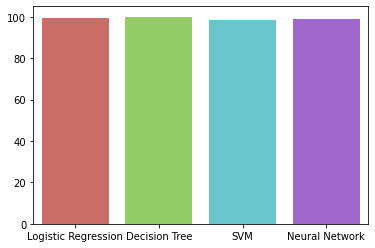

In [64]:
for i in range(len(result[1])):
    result[1][i] = result[1][i]*100

sns.barplot(result[0], result[1], palette="hls")

plt.show()

In [65]:
result

[['Logistic Regression', 'Decision Tree', 'SVM', 'Neural Network'],
 [99.15254237288136, 100.0, 98.58757062146893, 98.87005686759949]]